## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "singer_age_decade_40"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "singer_age_decade"
target_positive_class = 40


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 100


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6433
Epoch 11 Validation Loss: 0.6794
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6017
Epoch 21 Validation Loss: 0.6709
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5655
Epoch 31 Validation Loss: 0.6670
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5335
Epoch 41 Validation Loss: 0.6664
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_40/loss_history.json


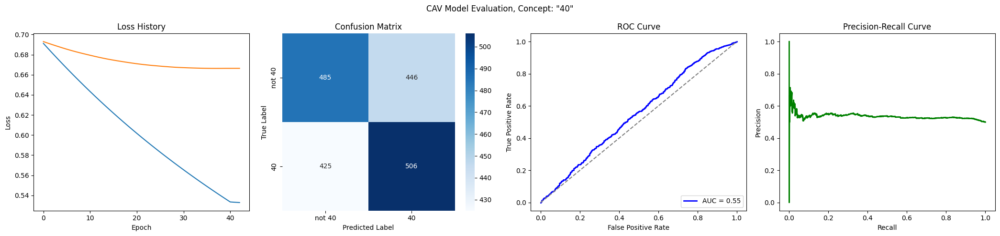

Training run 2/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6432
Epoch 11 Validation Loss: 0.6808
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5987
Epoch 21 Validation Loss: 0.6769
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_40/loss_history.json


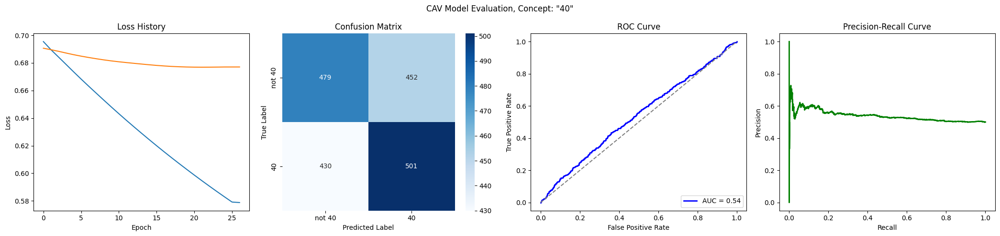

Training run 3/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6910
Epoch 1 Validation Loss: 0.6975
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6510
Epoch 11 Validation Loss: 0.6971
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6496
Epoch 21 Validation Loss: 0.6971
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_40/loss_history.json


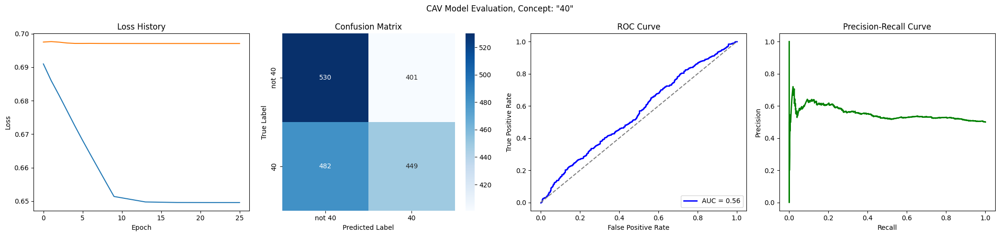

Training run 4/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6888
Epoch 1 Validation Loss: 0.6882
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6371
Epoch 11 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_40/loss_history.json


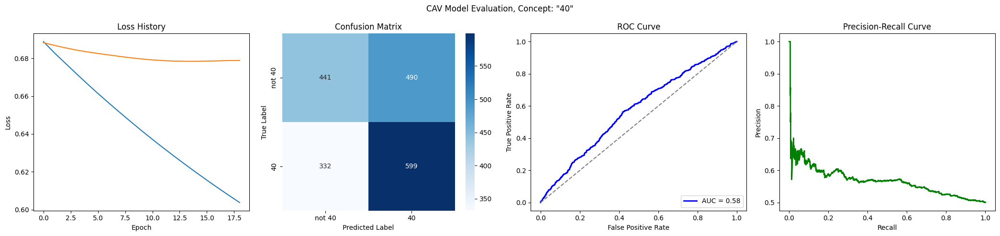

Training run 5/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6895
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 9
Loss history saved to trainings/singer_age_decade_40/loss_history.json


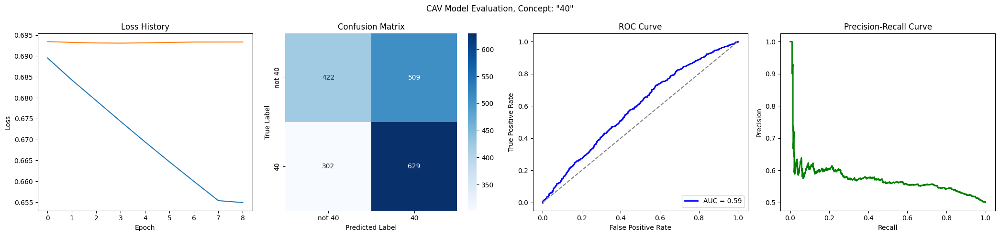

Training run 6/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6961
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6430
Epoch 11 Validation Loss: 0.6885
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5985
Epoch 21 Validation Loss: 0.6849
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5609
Epoch 31 Validation Loss: 0.6844
Early stopping at epoch 33
Loss history saved to trainings/singer_age_decade_40/loss_history.json


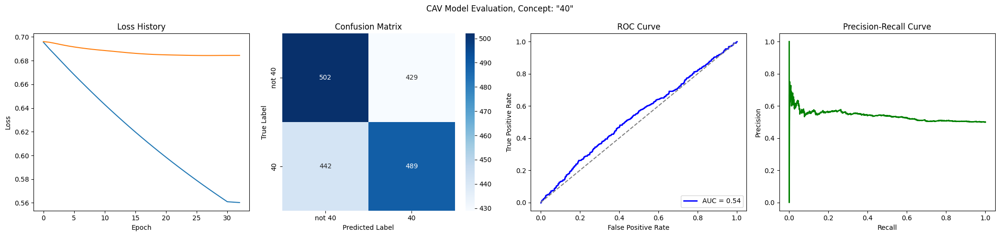

Training run 7/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7020
Epoch 1 Validation Loss: 0.7015
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6580
Epoch 11 Validation Loss: 0.6986
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_40/loss_history.json


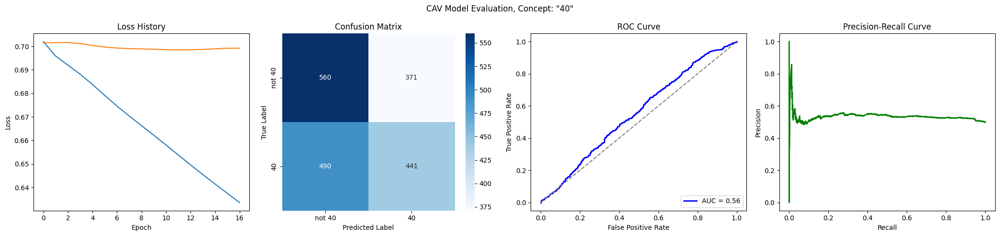

Training run 8/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6561
Epoch 11 Validation Loss: 0.6813
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6216
Epoch 21 Validation Loss: 0.6753
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5901
Epoch 31 Validation Loss: 0.6713
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5614
Epoch 41 Validation Loss: 0.6690
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5352
Epoch 51 Validation Loss: 0.6684
Early stopping at epoch 54
Loss history saved to trainings/singer_age_decade_40/loss_history.json


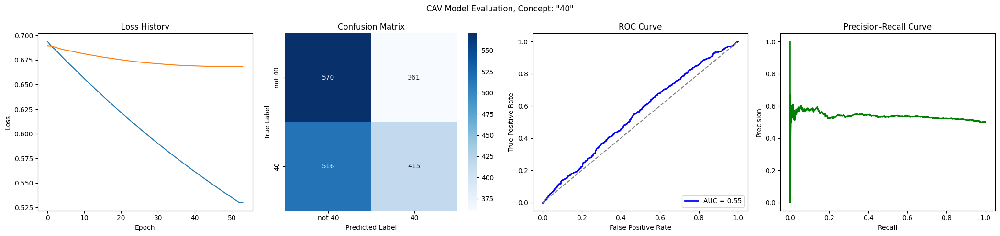

Training run 9/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6506
Epoch 11 Validation Loss: 0.6867
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6106
Epoch 21 Validation Loss: 0.6824
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5751
Epoch 31 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 39
Loss history saved to trainings/singer_age_decade_40/loss_history.json


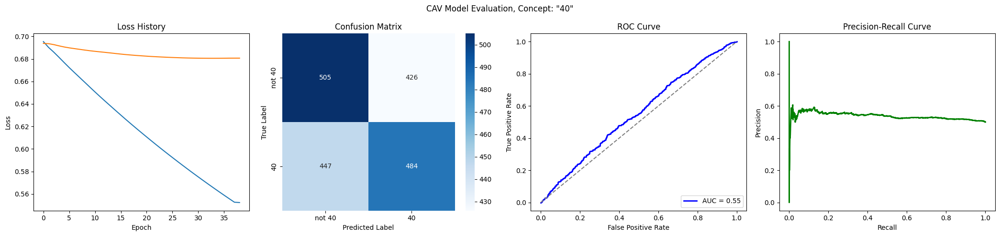

Training run 10/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7033
Epoch 1 Validation Loss: 0.6988
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 8
Loss history saved to trainings/singer_age_decade_40/loss_history.json


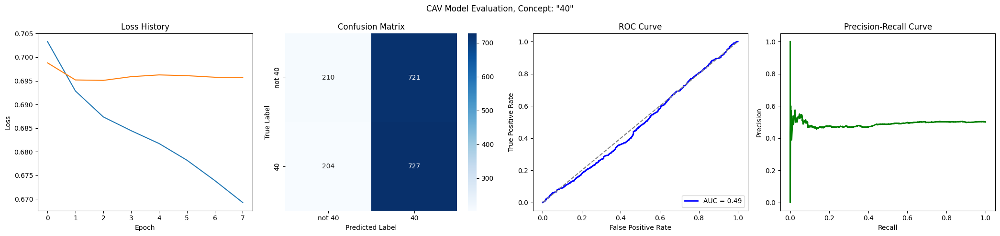

Training run 11/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_40/loss_history.json


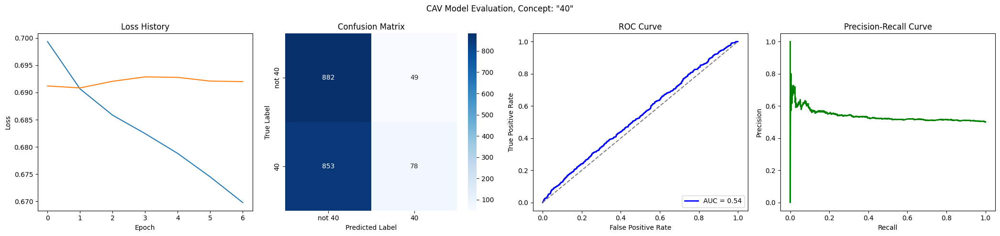

Training run 12/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6486
Epoch 11 Validation Loss: 0.6867
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6098
Epoch 21 Validation Loss: 0.6850
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_40/loss_history.json


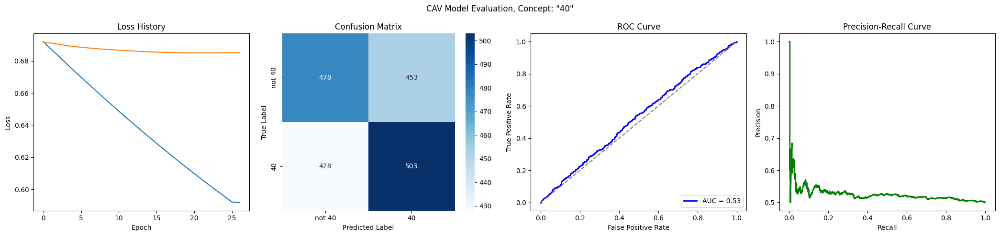

Training run 13/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.7005
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6582
Epoch 11 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6215
Epoch 21 Validation Loss: 0.6940
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_40/loss_history.json


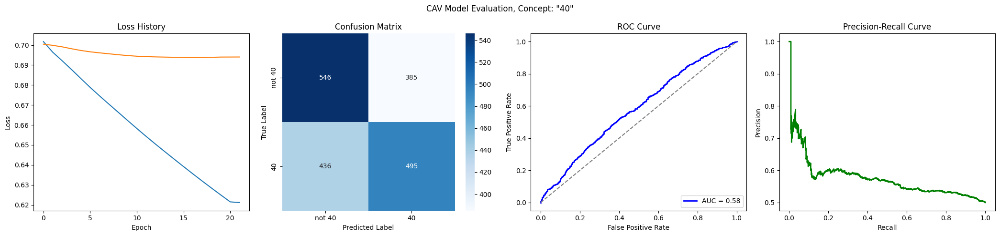

Training run 14/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


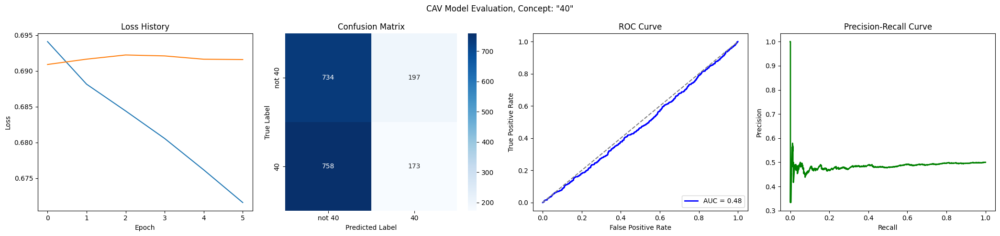

Training run 15/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6461
Epoch 11 Validation Loss: 0.6838
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6026
Epoch 21 Validation Loss: 0.6772
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5646
Epoch 31 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5316
Epoch 41 Validation Loss: 0.6733
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_40/loss_history.json


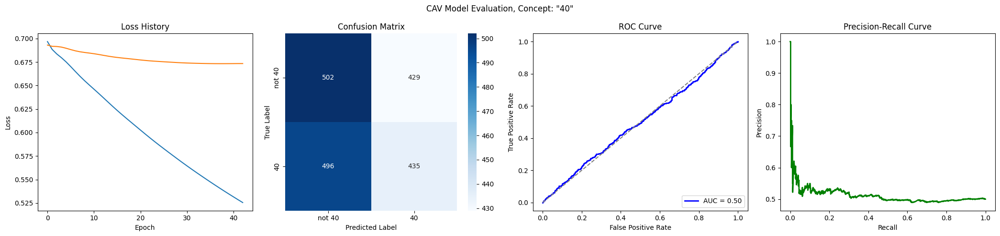

Training run 16/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6962
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_40/loss_history.json


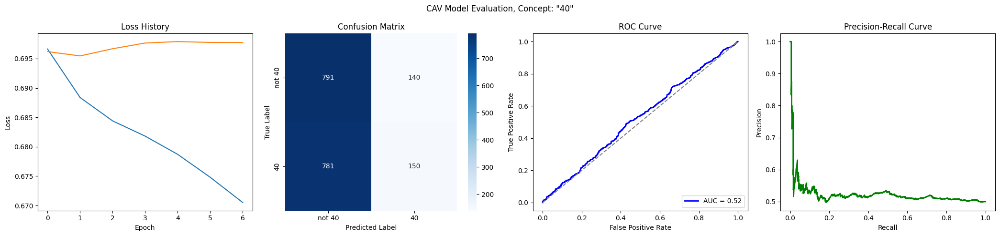

Training run 17/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7070
Epoch 1 Validation Loss: 0.6983
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6603
Epoch 11 Validation Loss: 0.6926
Epoch 21/500
Epoch 21 Train Loss: 0.6229
Epoch 21 Validation Loss: 0.6909
Epoch 31/500
Epoch 31 Train Loss: 0.6130
Epoch 31 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6094
Epoch 41 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.6065
Epoch 51 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.6064
Epoch 61 Validation Loss: 0.6900
Early stopping at epoch 64
Loss history saved to trainings/singer_age_decade_40/loss_history.json


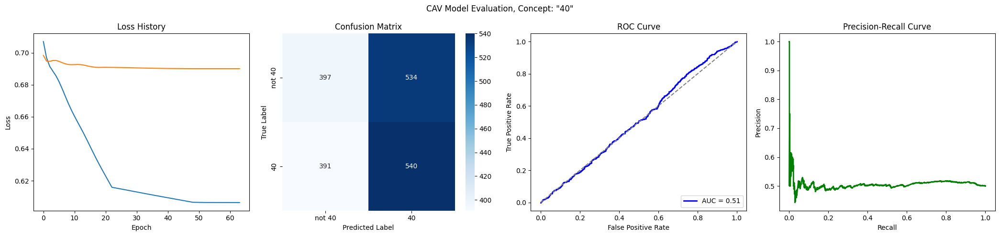

Training run 18/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6906
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6487
Epoch 11 Validation Loss: 0.6910
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_40/loss_history.json


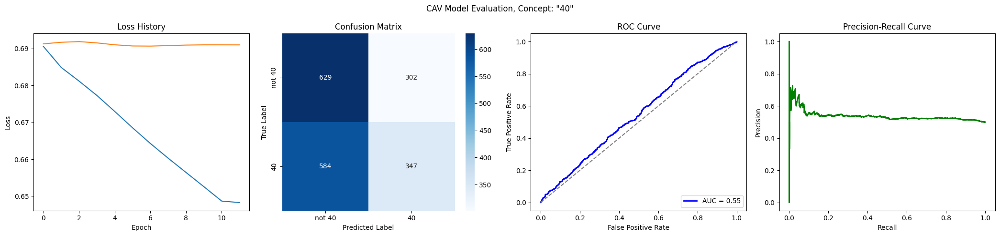

Training run 19/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6497
Epoch 11 Validation Loss: 0.6834
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6101
Epoch 21 Validation Loss: 0.6747
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5749
Epoch 31 Validation Loss: 0.6666
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5433
Epoch 41 Validation Loss: 0.6598
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5147
Epoch 51 Validation Loss: 0.6548
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4887
Epoch 61 Validation Loss: 0.6514
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

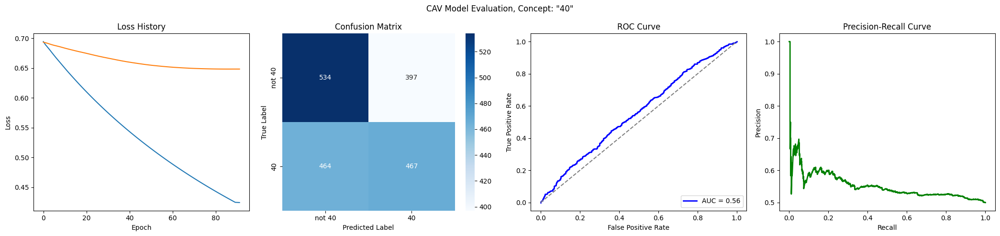

Training run 20/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6871
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6394
Epoch 11 Validation Loss: 0.6755
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5946
Epoch 21 Validation Loss: 0.6702
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5565
Epoch 31 Validation Loss: 0.6694
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 37
Loss history saved to trainings/singer_age_decade_40/loss_history.json


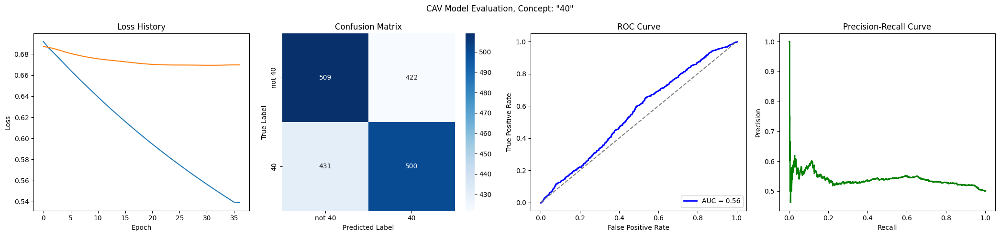

Training run 21/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6475
Epoch 11 Validation Loss: 0.6815
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6092
Epoch 21 Validation Loss: 0.6738
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5762
Epoch 31 Validation Loss: 0.6682
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5474
Epoch 41 Validation Loss: 0.6644
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5219
Epoch 51 Validation Loss: 0.6622
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4989
Epoch 61 Validation Loss: 0.6611
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

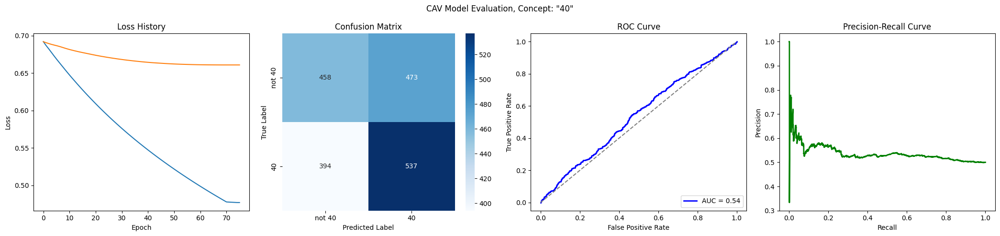

Training run 22/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6425
Epoch 11 Validation Loss: 0.6900
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_40/loss_history.json


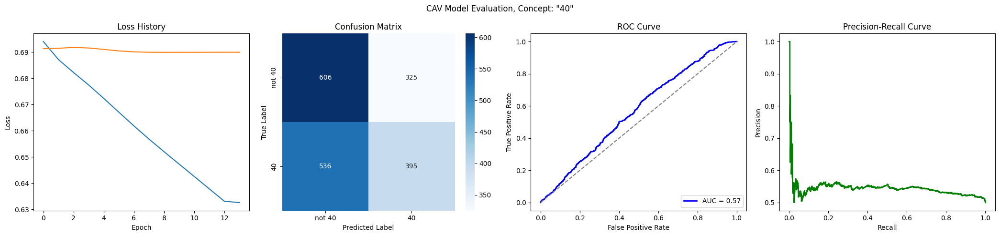

Training run 23/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6439
Epoch 11 Validation Loss: 0.6861
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6006
Epoch 21 Validation Loss: 0.6833
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5640
Epoch 31 Validation Loss: 0.6829
Early stopping at epoch 33
Loss history saved to trainings/singer_age_decade_40/loss_history.json


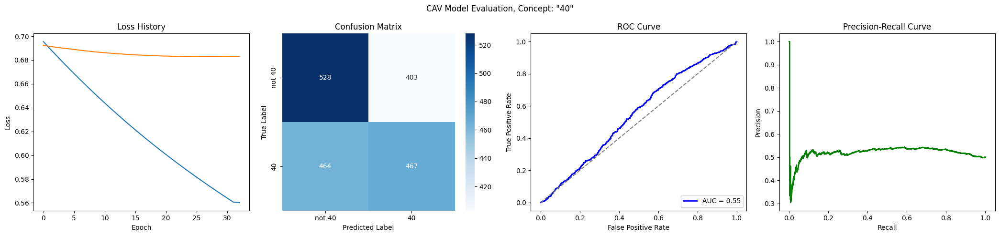

Training run 24/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7011
Epoch 1 Validation Loss: 0.6973
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6557
Epoch 11 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6233
Epoch 21 Validation Loss: 0.6932
Early stopping at epoch 21
Loss history saved to trainings/singer_age_decade_40/loss_history.json


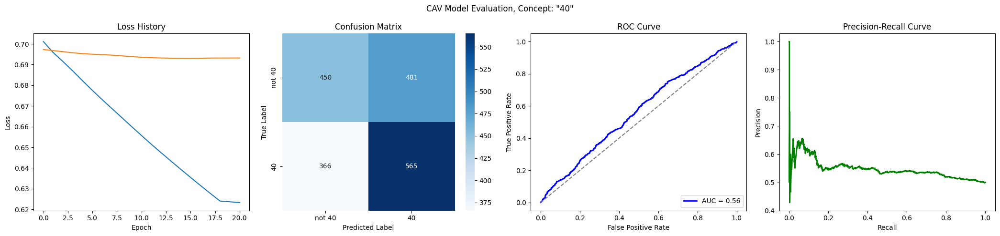

Training run 25/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6540
Epoch 11 Validation Loss: 0.6781
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6170
Epoch 21 Validation Loss: 0.6661
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5841
Epoch 31 Validation Loss: 0.6570
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5544
Epoch 41 Validation Loss: 0.6507
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5274
Epoch 51 Validation Loss: 0.6468
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5027
Epoch 61 Validation Loss: 0.6445
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

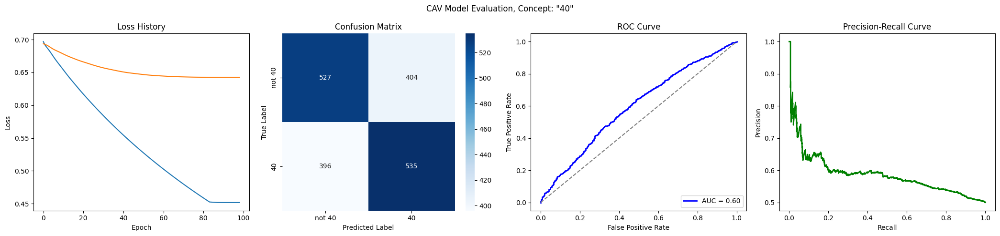

Training run 26/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6483
Epoch 11 Validation Loss: 0.6864
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_40/loss_history.json


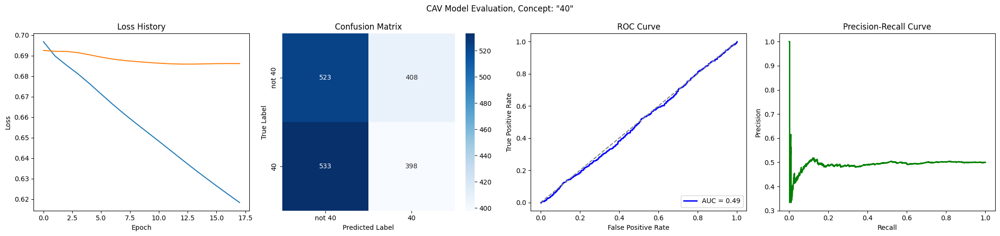

Training run 27/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6958
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6424
Epoch 11 Validation Loss: 0.6944
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_40/loss_history.json


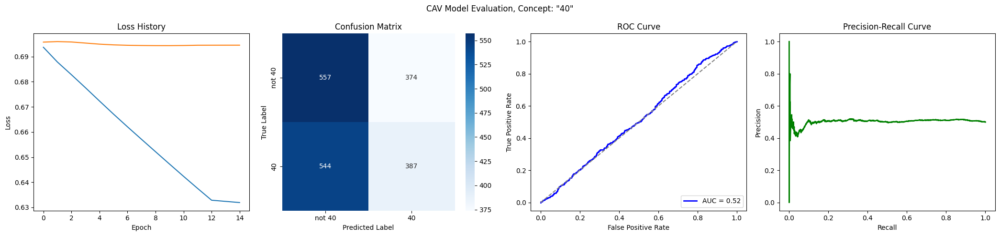

Training run 28/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7060
Epoch 1 Validation Loss: 0.6986
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6430
Epoch 11 Validation Loss: 0.6869
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5957
Epoch 21 Validation Loss: 0.6816
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5578
Epoch 31 Validation Loss: 0.6795
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5288
Epoch 41 Validation Loss: 0.6793
Early stopping at epoch 41
Loss history saved to trainings/singer_age_decade_40/loss_history.json


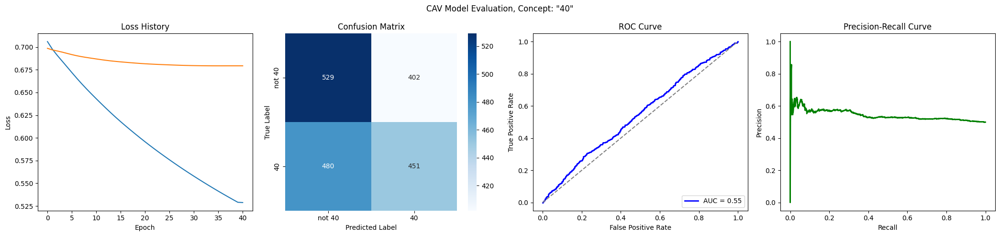

Training run 29/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6609
Epoch 11 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6282
Epoch 21 Validation Loss: 0.6852
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5988
Epoch 31 Validation Loss: 0.6845
Early stopping at epoch 33
Loss history saved to trainings/singer_age_decade_40/loss_history.json


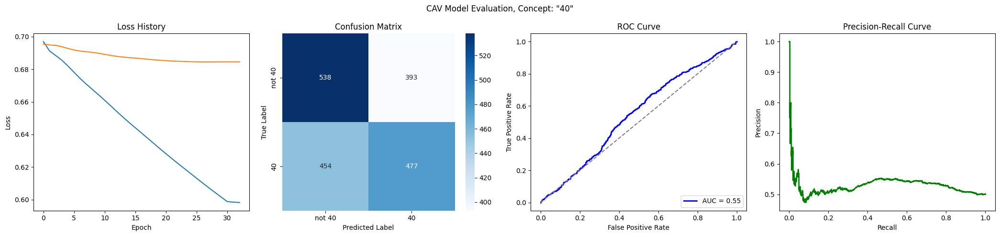

Training run 30/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6464
Epoch 11 Validation Loss: 0.6896
Early stopping at epoch 13
Loss history saved to trainings/singer_age_decade_40/loss_history.json


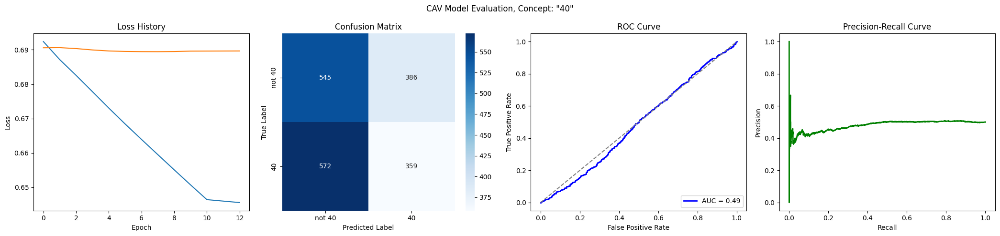

Training run 31/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6969
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6301
Epoch 11 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_40/loss_history.json


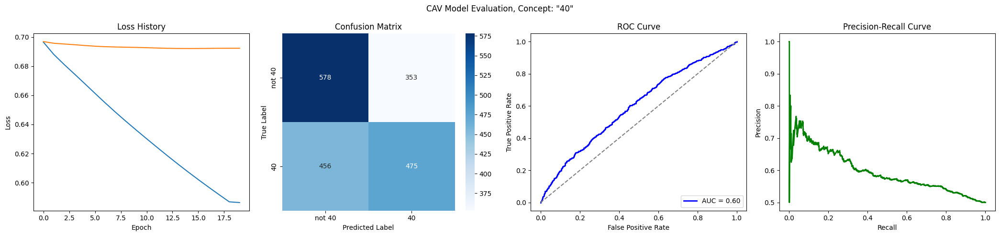

Training run 32/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6844
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6416
Epoch 11 Validation Loss: 0.6777
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5970
Epoch 21 Validation Loss: 0.6749
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5651
Epoch 31 Validation Loss: 0.6748
Early stopping at epoch 32
Loss history saved to trainings/singer_age_decade_40/loss_history.json


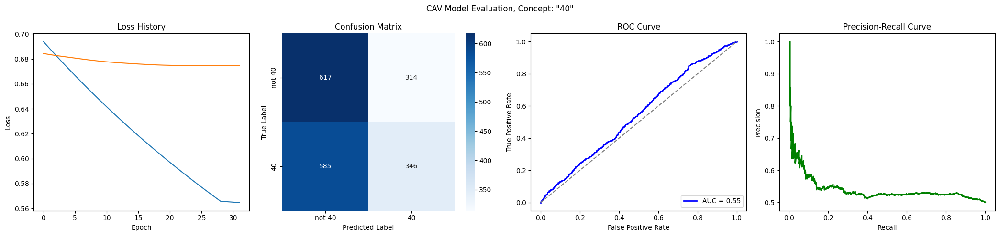

Training run 33/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7022
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6478
Epoch 11 Validation Loss: 0.6892
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6030
Epoch 21 Validation Loss: 0.6883
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_40/loss_history.json


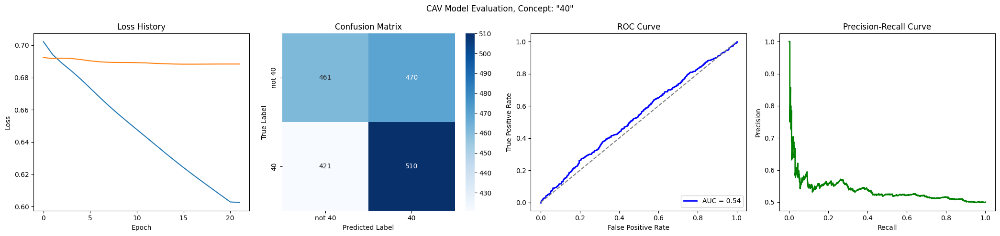

Training run 34/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7034
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6531
Epoch 11 Validation Loss: 0.6834
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6144
Epoch 21 Validation Loss: 0.6802
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5799
Epoch 31 Validation Loss: 0.6780
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5488
Epoch 41 Validation Loss: 0.6767
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5206
Epoch 51 Validation Loss: 0.6756
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4948
Epoch 61 Validation Loss: 0.6749
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

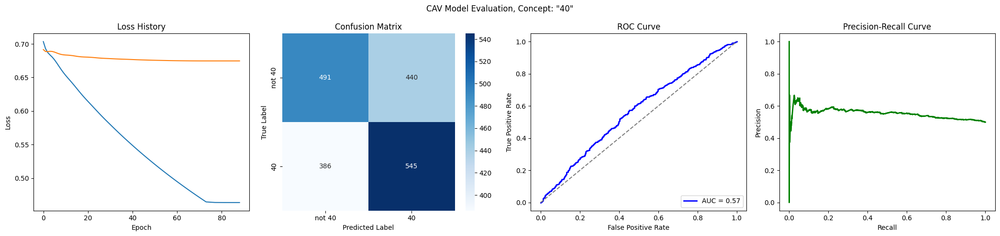

Training run 35/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6461
Epoch 11 Validation Loss: 0.6861
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6055
Epoch 21 Validation Loss: 0.6840
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/singer_age_decade_40/loss_history.json


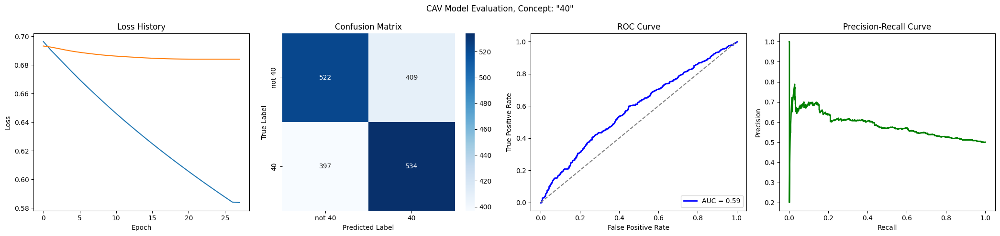

Training run 36/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6479
Epoch 11 Validation Loss: 0.6835
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6076
Epoch 21 Validation Loss: 0.6785
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5723
Epoch 31 Validation Loss: 0.6767
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 40
Loss history saved to trainings/singer_age_decade_40/loss_history.json


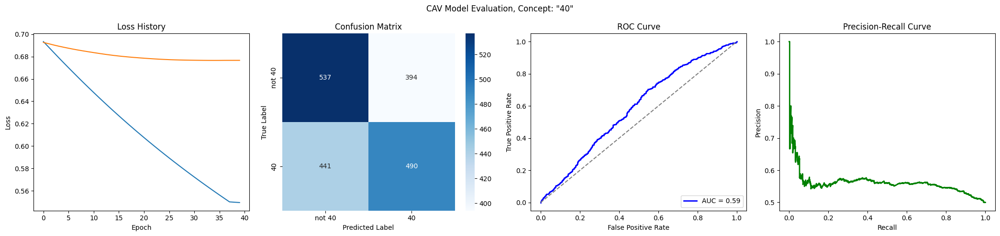

Training run 37/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6553
Epoch 11 Validation Loss: 0.6878
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_40/loss_history.json


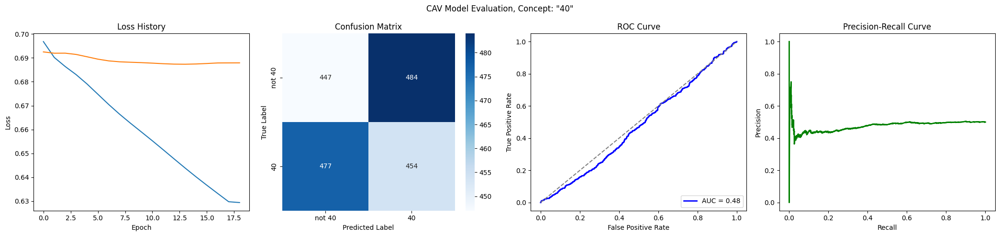

Training run 38/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7042
Epoch 1 Validation Loss: 0.6952
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6603
Epoch 11 Validation Loss: 0.6850
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6284
Epoch 21 Validation Loss: 0.6798
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5995
Epoch 31 Validation Loss: 0.6782
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5734
Epoch 41 Validation Loss: 0.6776
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_40/loss_history.json


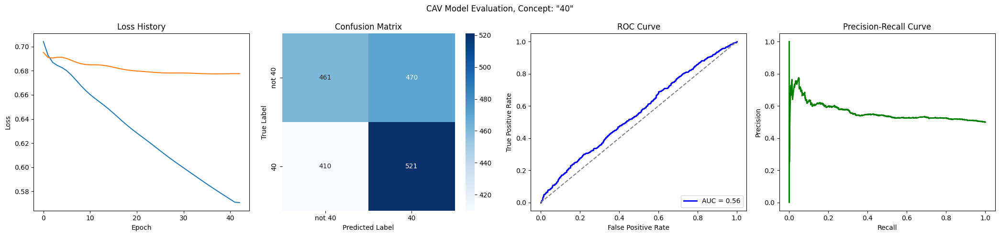

Training run 39/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


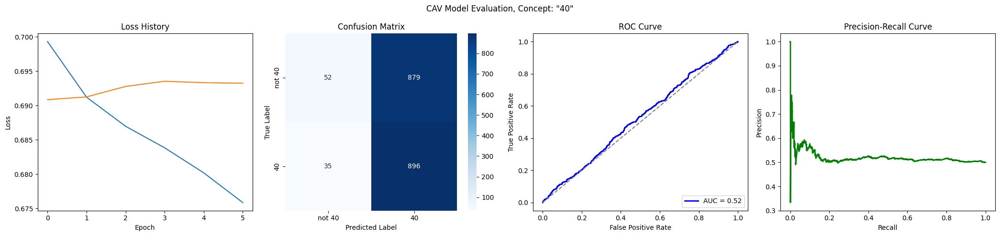

Training run 40/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7022
Epoch 1 Validation Loss: 0.6970
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6503
Epoch 11 Validation Loss: 0.6824
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6080
Epoch 21 Validation Loss: 0.6721
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5720
Epoch 31 Validation Loss: 0.6671
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5413
Epoch 41 Validation Loss: 0.6647
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5145
Epoch 51 Validation Loss: 0.6640
Early stopping at epoch 55
Loss history saved to trainings/singer_age_decade_40/loss_history.json


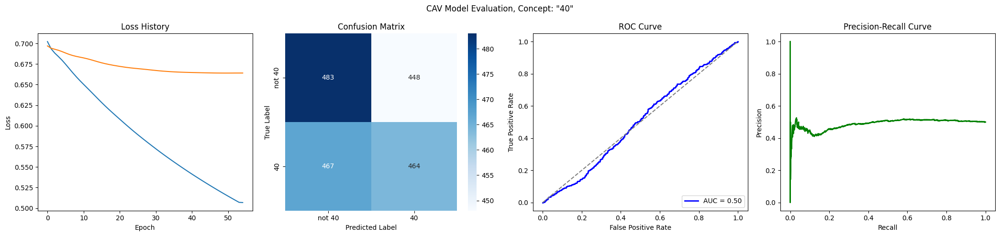

Training run 41/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6936
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6399
Epoch 11 Validation Loss: 0.6868
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_40/loss_history.json


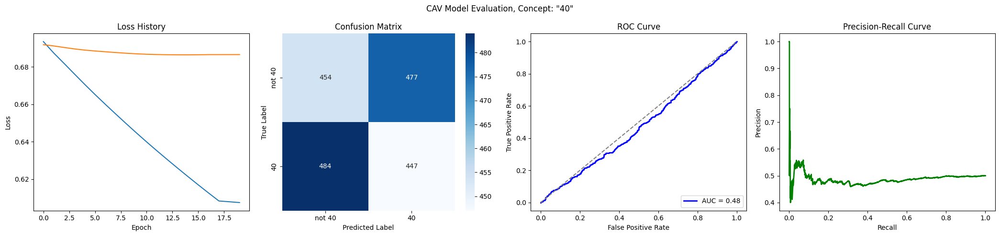

Training run 42/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6436
Epoch 11 Validation Loss: 0.6782
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6014
Epoch 21 Validation Loss: 0.6657
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5646
Epoch 31 Validation Loss: 0.6575
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5327
Epoch 41 Validation Loss: 0.6514
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5046
Epoch 51 Validation Loss: 0.6471
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4792
Epoch 61 Validation Loss: 0.6448
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

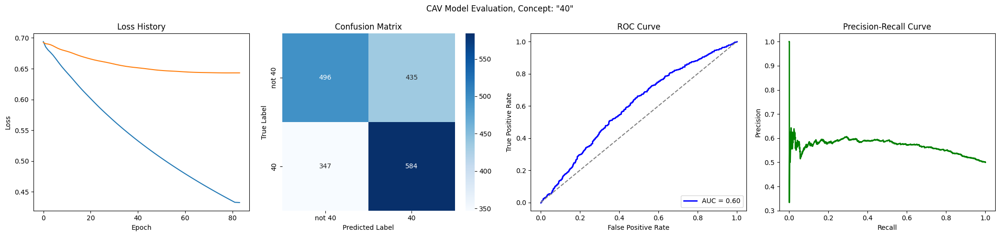

Training run 43/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6429
Epoch 11 Validation Loss: 0.6841
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5994
Epoch 21 Validation Loss: 0.6803
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5631
Epoch 31 Validation Loss: 0.6794
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 39
Loss history saved to trainings/singer_age_decade_40/loss_history.json


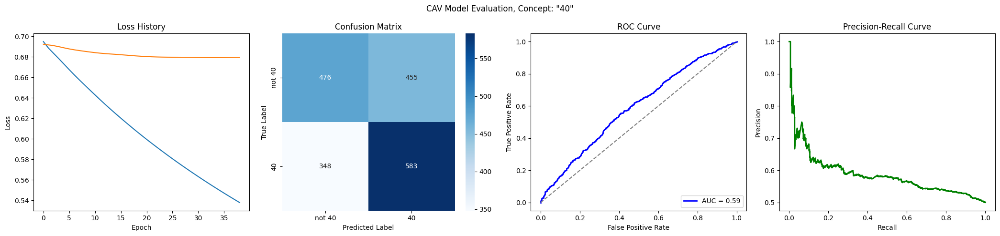

Training run 44/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6505
Epoch 11 Validation Loss: 0.6885
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_40/loss_history.json


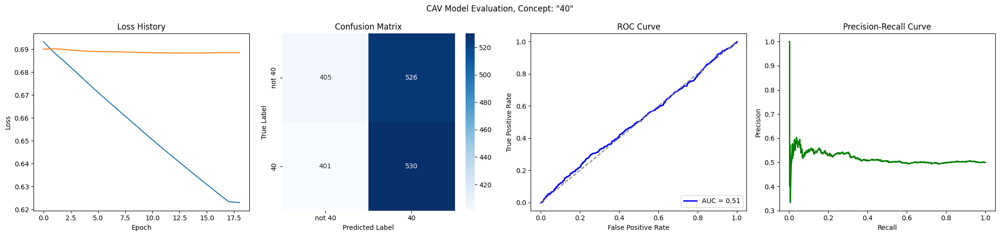

Training run 45/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6950
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


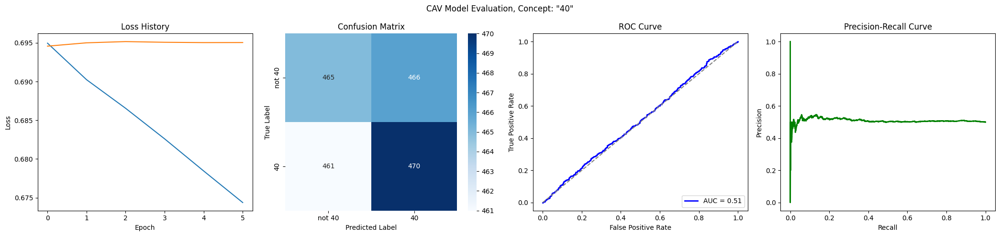

Training run 46/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6914
Epoch 1 Validation Loss: 0.6907
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


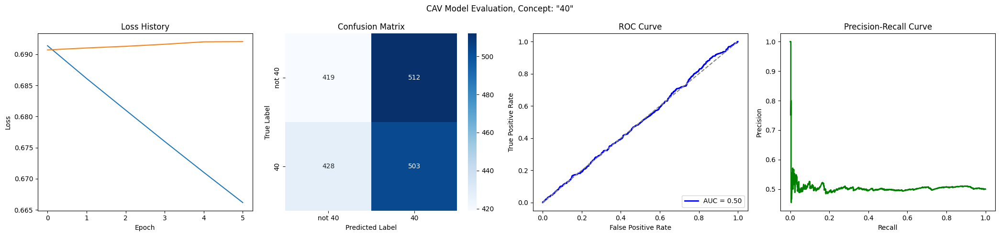

Training run 47/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6868
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6332
Epoch 11 Validation Loss: 0.6867
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5885
Epoch 21 Validation Loss: 0.6851
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_40/loss_history.json


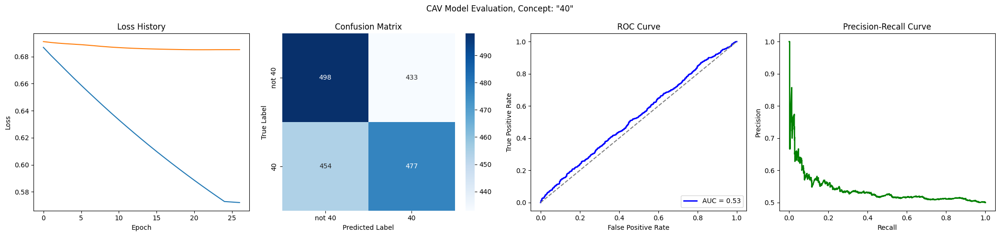

Training run 48/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6885
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


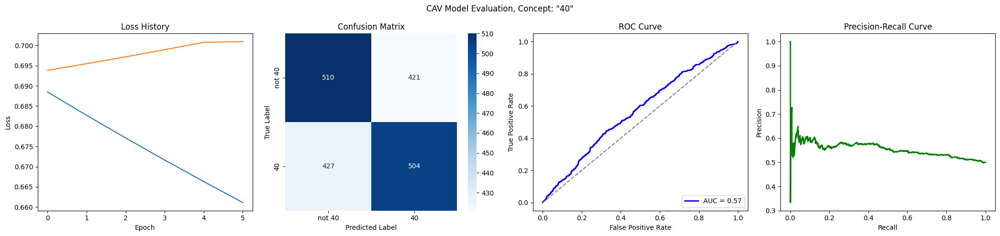

Training run 49/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_40/loss_history.json


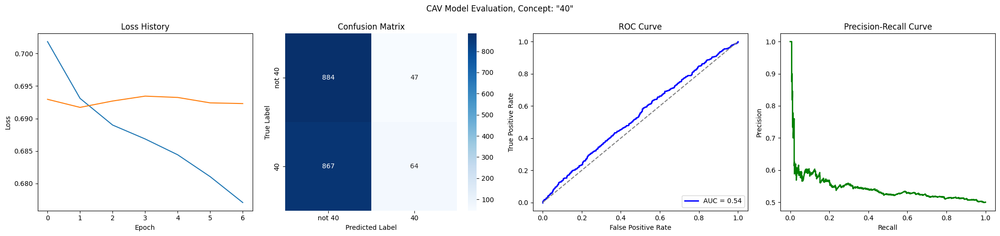

Training run 50/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_40/loss_history.json


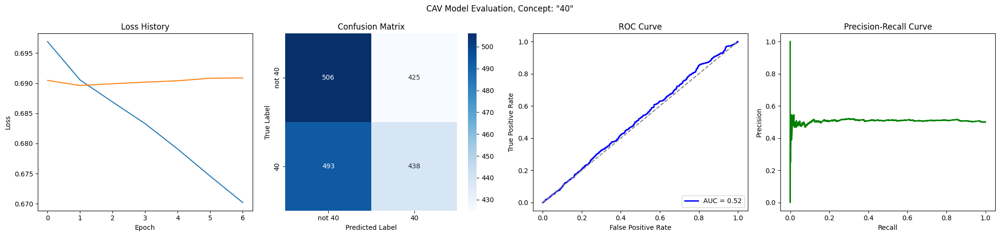

Training run 51/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6980
Epoch 1 Validation Loss: 0.6960
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6487
Epoch 11 Validation Loss: 0.6868
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6062
Epoch 21 Validation Loss: 0.6817
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5695
Epoch 31 Validation Loss: 0.6800
Early stopping at epoch 35
Loss history saved to trainings/singer_age_decade_40/loss_history.json


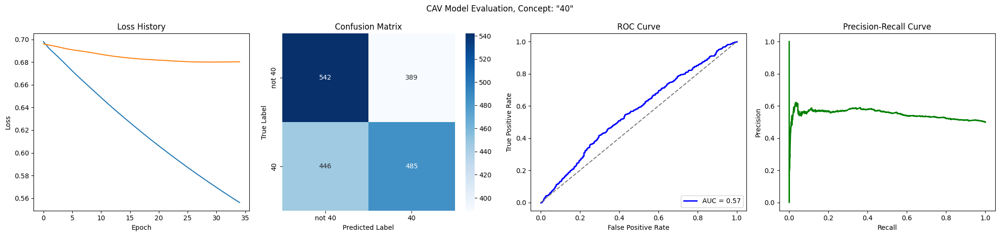

Training run 52/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6882
Epoch 1 Validation Loss: 0.6968
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


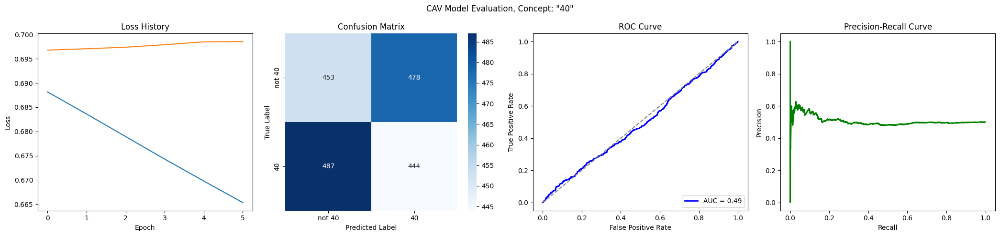

Training run 53/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6474
Epoch 11 Validation Loss: 0.6858
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6088
Epoch 21 Validation Loss: 0.6846
Early stopping at epoch 21
Loss history saved to trainings/singer_age_decade_40/loss_history.json


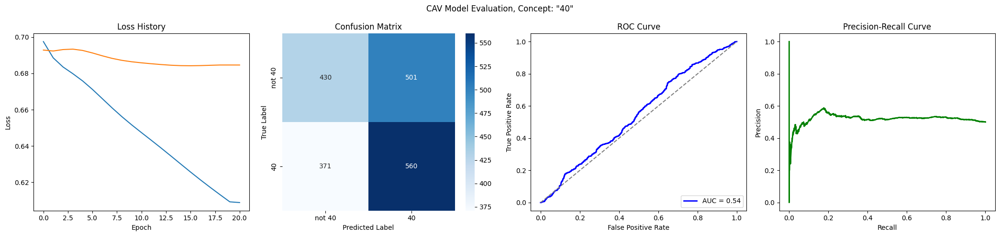

Training run 54/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6883
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6433
Epoch 11 Validation Loss: 0.6848
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6011
Epoch 21 Validation Loss: 0.6828
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5650
Epoch 31 Validation Loss: 0.6819
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5336
Epoch 41 Validation Loss: 0.6812
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5059
Epoch 51 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4810
Epoch 61 Validation Loss: 0.6794
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

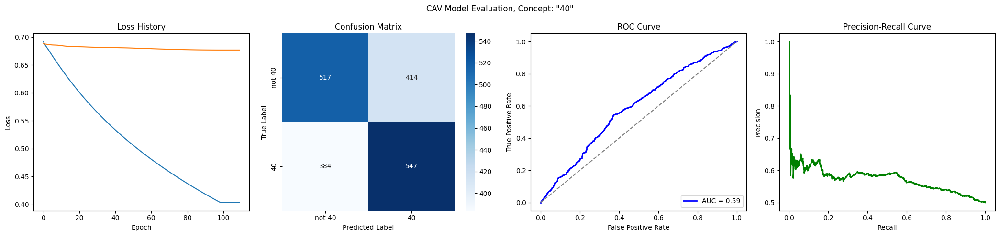

Training run 55/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6904
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6270
Epoch 11 Validation Loss: 0.6817
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5739
Epoch 21 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5294
Epoch 31 Validation Loss: 0.6677
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4918
Epoch 41 Validation Loss: 0.6639
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4595
Epoch 51 Validation Loss: 0.6625
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/singer_age_decade_40/loss_history.json


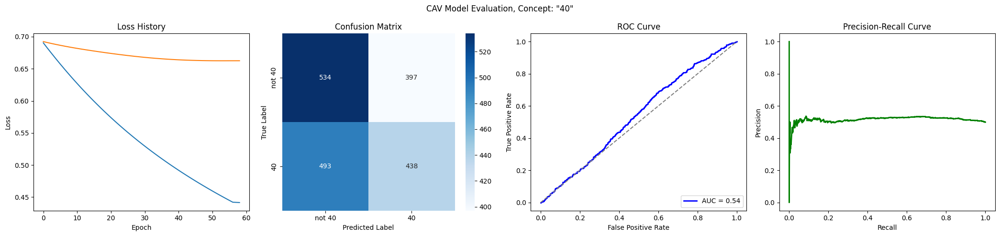

Training run 56/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6518
Epoch 11 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_40/loss_history.json


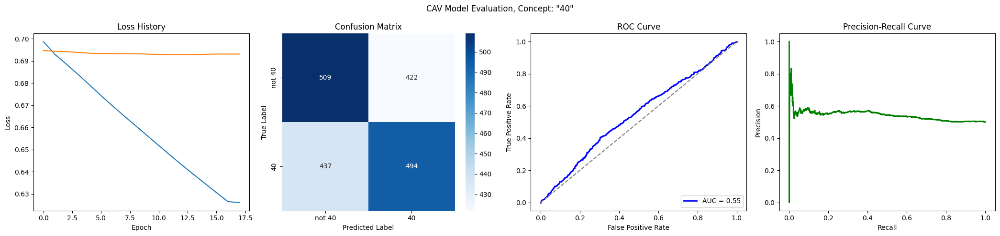

Training run 57/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6973
Epoch 1 Validation Loss: 0.6973
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


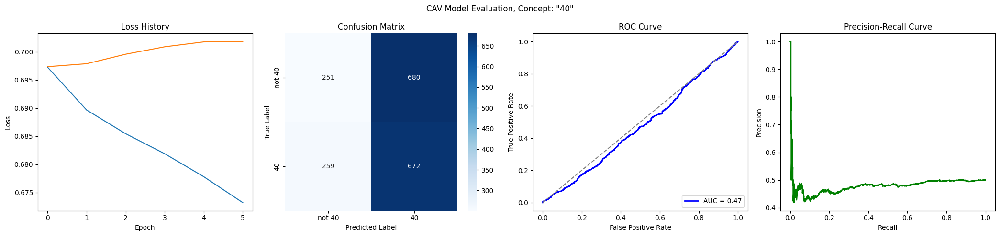

Training run 58/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6973
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6442
Epoch 11 Validation Loss: 0.6933
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_40/loss_history.json


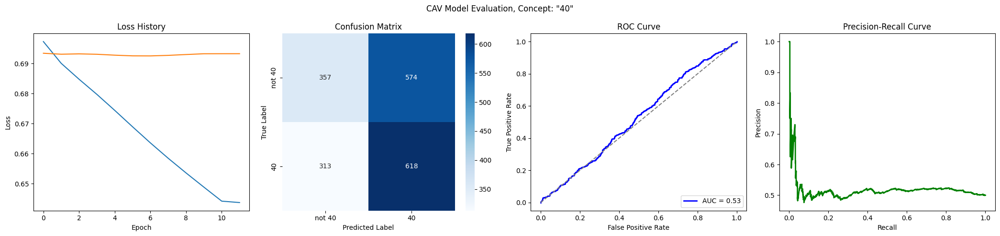

Training run 59/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


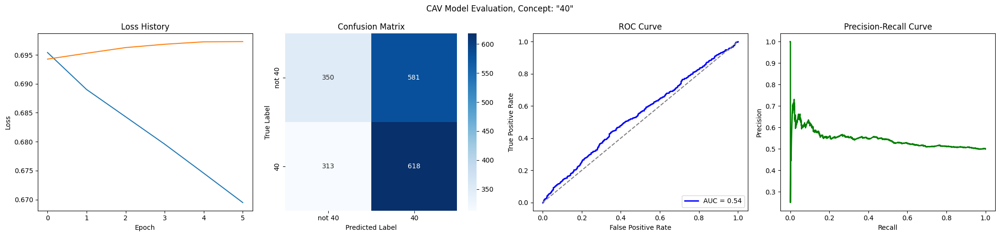

Training run 60/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6926
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_40/loss_history.json


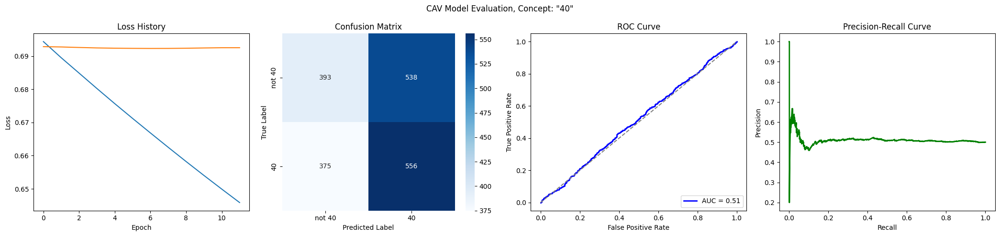

Training run 61/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6910
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6426
Epoch 11 Validation Loss: 0.6875
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6020
Epoch 21 Validation Loss: 0.6833
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5668
Epoch 31 Validation Loss: 0.6805
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5358
Epoch 41 Validation Loss: 0.6787
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5082
Epoch 51 Validation Loss: 0.6781
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/singer_age_decade_40/loss_history.json


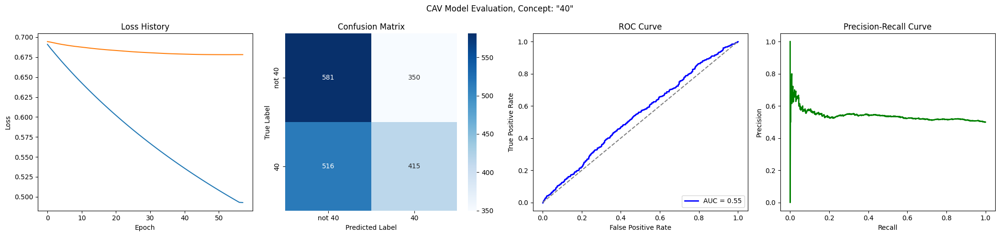

Training run 62/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6997
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6692
Epoch 11 Validation Loss: 0.6992
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6645
Epoch 21 Validation Loss: 0.6987
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6626
Epoch 31 Validation Loss: 0.6987
Early stopping at epoch 37
Loss history saved to trainings/singer_age_decade_40/loss_history.json


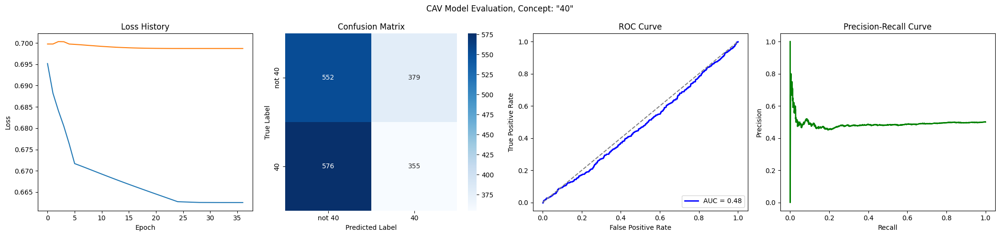

Training run 63/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6466
Epoch 11 Validation Loss: 0.6713
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6075
Epoch 21 Validation Loss: 0.6576
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5741
Epoch 31 Validation Loss: 0.6475
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5450
Epoch 41 Validation Loss: 0.6407
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5191
Epoch 51 Validation Loss: 0.6367
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4957
Epoch 61 Validation Loss: 0.6350
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

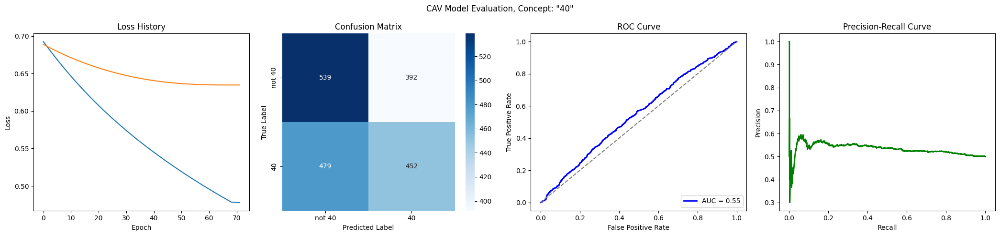

Training run 64/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6961
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6439
Epoch 11 Validation Loss: 0.6814
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6003
Epoch 21 Validation Loss: 0.6712
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5628
Epoch 31 Validation Loss: 0.6639
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5302
Epoch 41 Validation Loss: 0.6586
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5010
Epoch 51 Validation Loss: 0.6547
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4747
Epoch 61 Validation Loss: 0.6518
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

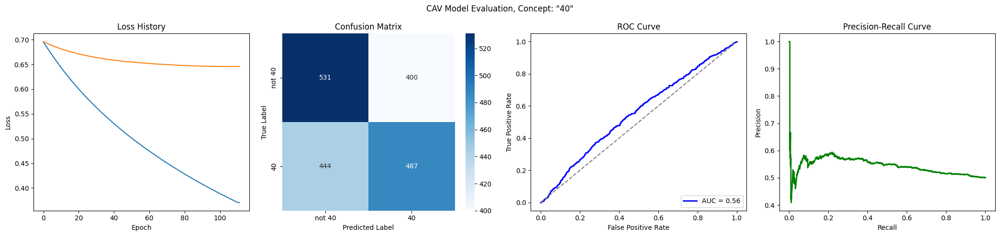

Training run 65/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6480
Epoch 11 Validation Loss: 0.6853
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6089
Epoch 21 Validation Loss: 0.6825
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/singer_age_decade_40/loss_history.json


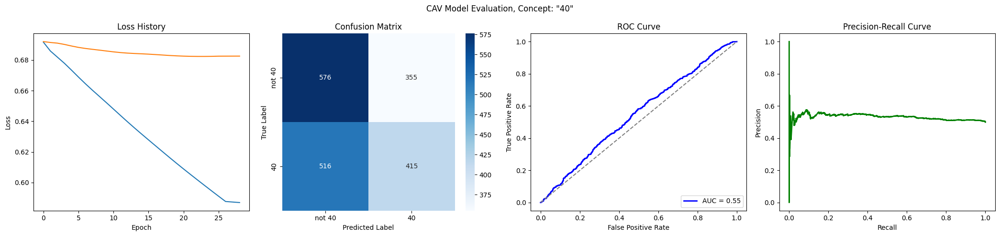

Training run 66/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6503
Epoch 11 Validation Loss: 0.6896
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6105
Epoch 21 Validation Loss: 0.6885
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_40/loss_history.json


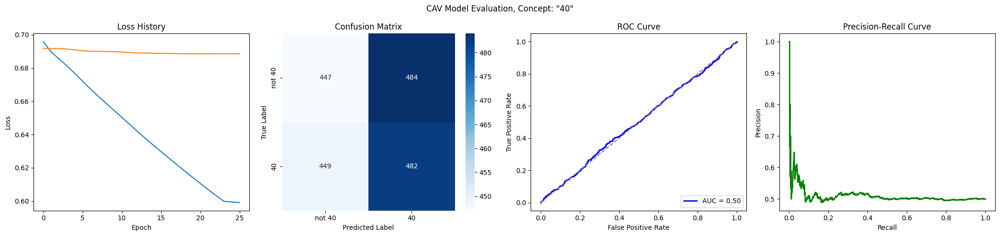

Training run 67/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6980
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6417
Epoch 11 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5975
Epoch 21 Validation Loss: 0.6868
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/singer_age_decade_40/loss_history.json


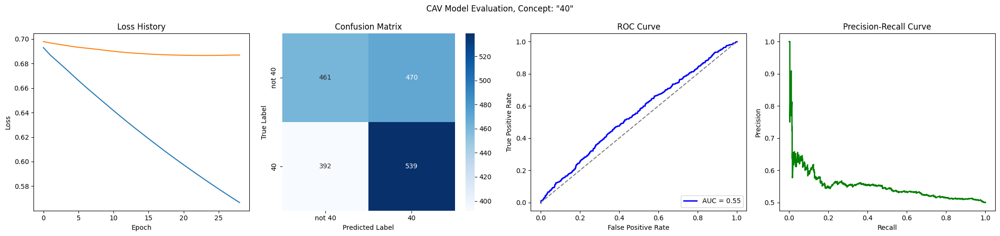

Training run 68/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6508
Epoch 11 Validation Loss: 0.6808
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6136
Epoch 21 Validation Loss: 0.6729
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5797
Epoch 31 Validation Loss: 0.6695
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5491
Epoch 41 Validation Loss: 0.6682
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5439
Epoch 51 Validation Loss: 0.6681
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5437
Epoch 61 Validation Loss: 0.6681
Early stopping at epoch 67
Loss history saved to trainings/singer_age_decade_40/loss_histor

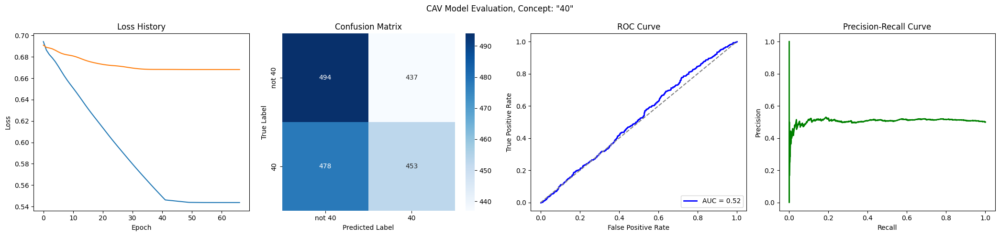

Training run 69/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6449
Epoch 11 Validation Loss: 0.6770
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5997
Epoch 21 Validation Loss: 0.6648
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5615
Epoch 31 Validation Loss: 0.6584
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5288
Epoch 41 Validation Loss: 0.6563
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 48
Loss history saved to trainings/singer_age_decade_40/loss_history.json


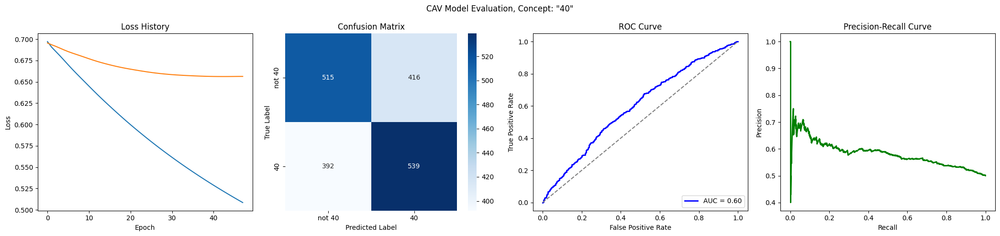

Training run 70/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7052
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_40/loss_history.json


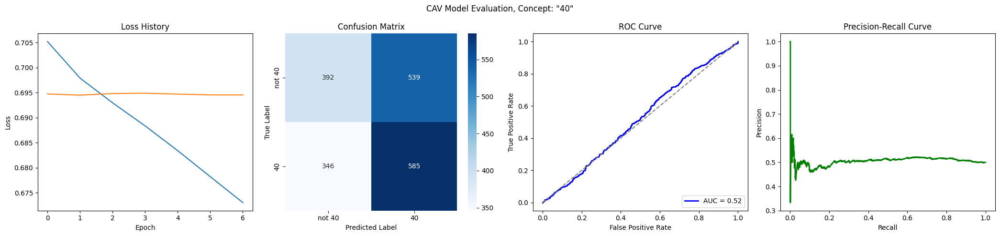

Training run 71/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6484
Epoch 11 Validation Loss: 0.6893
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6081
Epoch 21 Validation Loss: 0.6886
Early stopping at epoch 24
Loss history saved to trainings/singer_age_decade_40/loss_history.json


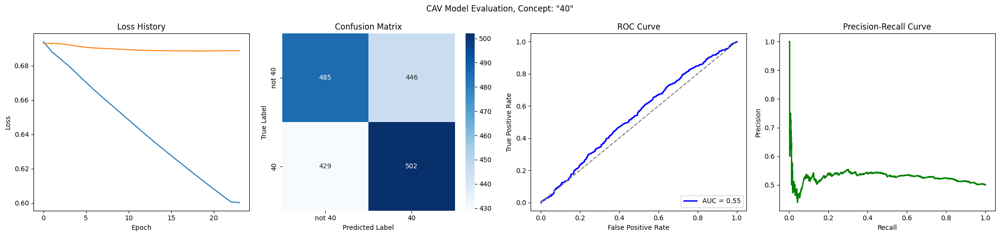

Training run 72/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6908
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6597
Epoch 11 Validation Loss: 0.6886
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_40/loss_history.json


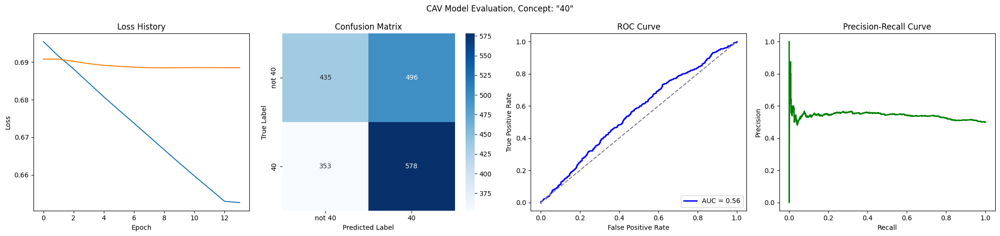

Training run 73/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6453
Epoch 11 Validation Loss: 0.6913
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 16
Loss history saved to trainings/singer_age_decade_40/loss_history.json


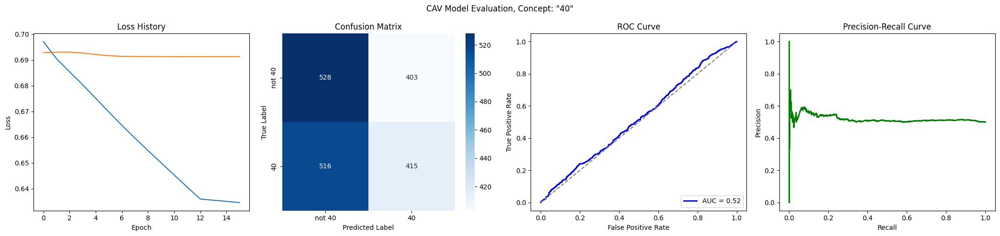

Training run 74/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7005
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


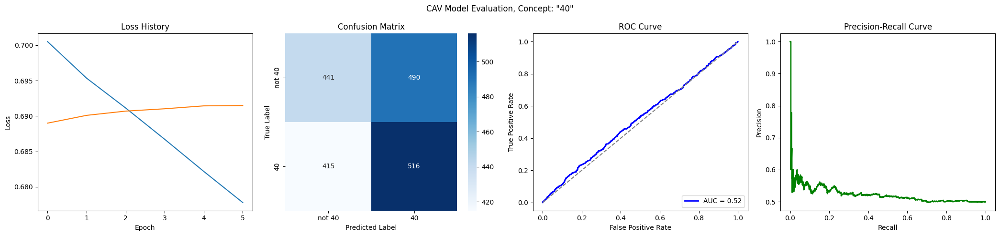

Training run 75/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6989
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6487
Epoch 11 Validation Loss: 0.6887
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6081
Epoch 21 Validation Loss: 0.6831
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5731
Epoch 31 Validation Loss: 0.6812
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 37
Loss history saved to trainings/singer_age_decade_40/loss_history.json


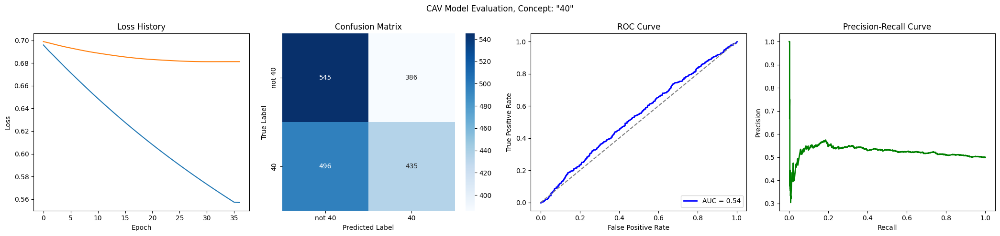

Training run 76/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6980
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6439
Epoch 11 Validation Loss: 0.6871
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6026
Epoch 21 Validation Loss: 0.6830
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_40/loss_history.json


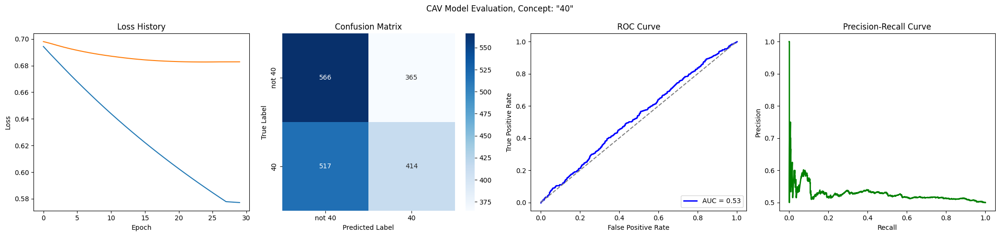

Training run 77/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6593
Epoch 11 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6260
Epoch 21 Validation Loss: 0.6878
Early stopping at epoch 25
Loss history saved to trainings/singer_age_decade_40/loss_history.json


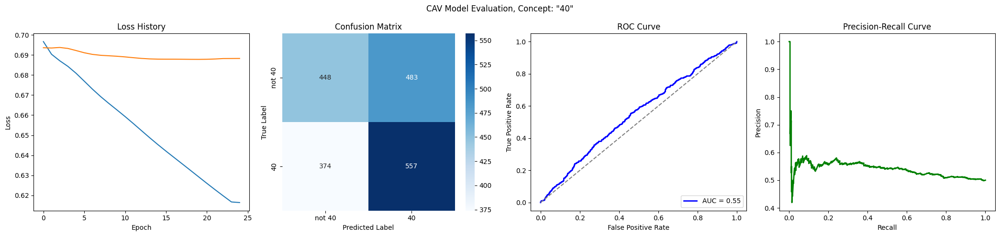

Training run 78/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6982
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


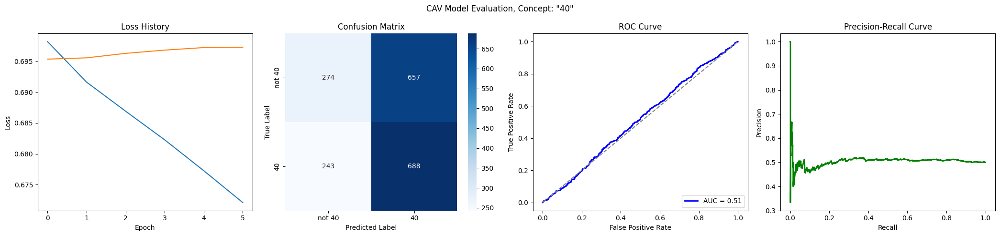

Training run 79/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6510
Epoch 11 Validation Loss: 0.6860
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6133
Epoch 21 Validation Loss: 0.6829
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_40/loss_history.json


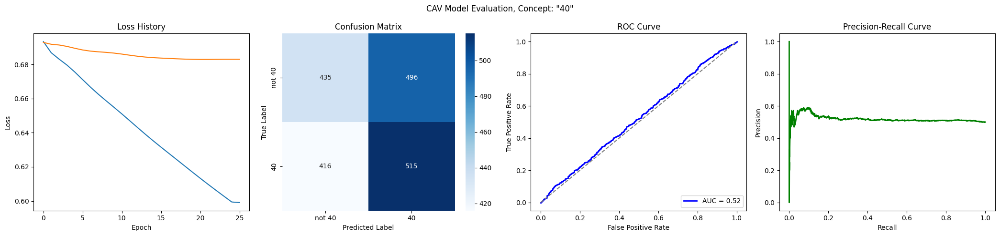

Training run 80/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6960
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6483
Epoch 11 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6134
Epoch 21 Validation Loss: 0.6895
Early stopping at epoch 21
Loss history saved to trainings/singer_age_decade_40/loss_history.json


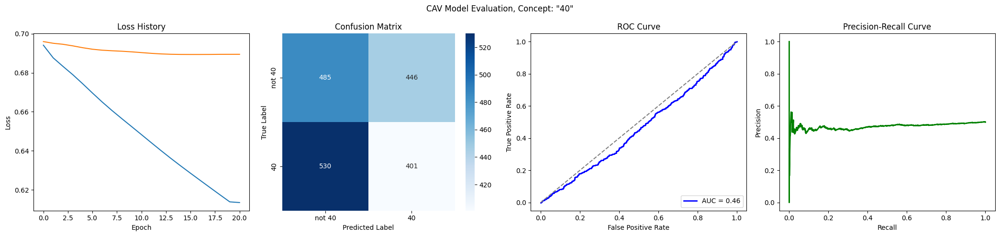

Training run 81/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6548
Epoch 11 Validation Loss: 0.6877
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6154
Epoch 21 Validation Loss: 0.6852
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5807
Epoch 31 Validation Loss: 0.6845
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5697
Epoch 41 Validation Loss: 0.6845
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5696
Epoch 51 Validation Loss: 0.6845
Early stopping at epoch 51
Loss history saved to trainings/singer_age_decade_40/loss_history.json


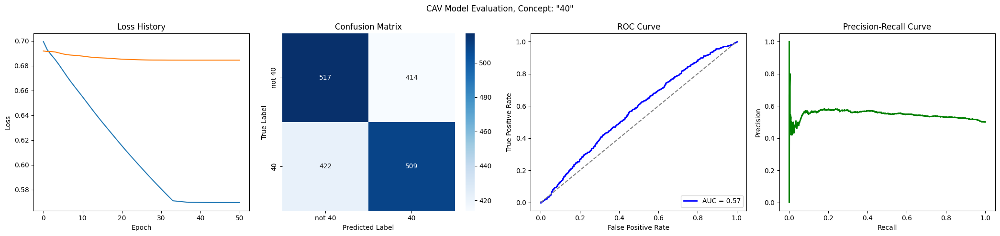

Training run 82/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


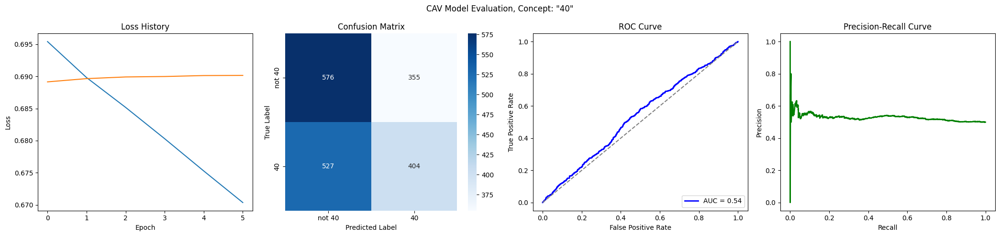

Training run 83/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6890
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6353
Epoch 11 Validation Loss: 0.6841
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_40/loss_history.json


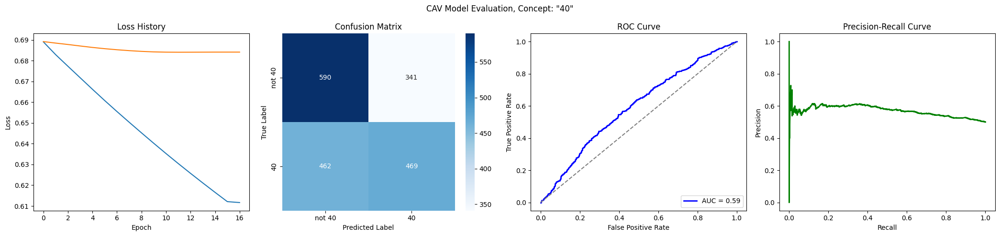

Training run 84/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


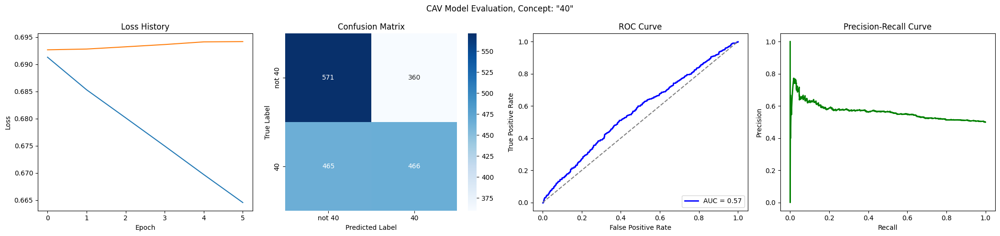

Training run 85/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6999
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6580
Epoch 11 Validation Loss: 0.6931
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_40/loss_history.json


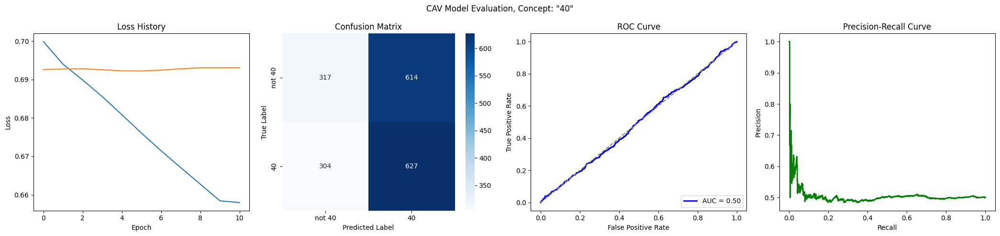

Training run 86/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6396
Epoch 11 Validation Loss: 0.6784
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5949
Epoch 21 Validation Loss: 0.6703
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5575
Epoch 31 Validation Loss: 0.6665
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5254
Epoch 41 Validation Loss: 0.6658
Early stopping at epoch 45
Loss history saved to trainings/singer_age_decade_40/loss_history.json


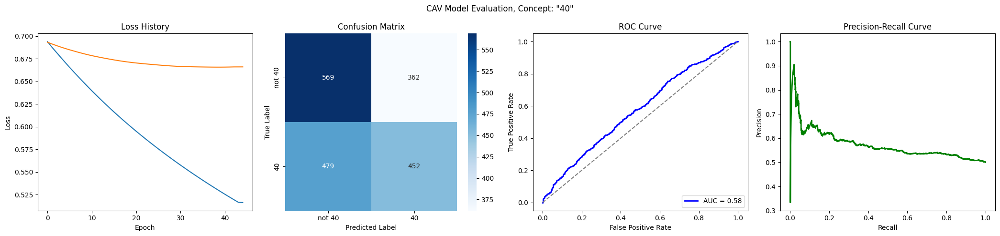

Training run 87/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6396
Epoch 11 Validation Loss: 0.6842
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5943
Epoch 21 Validation Loss: 0.6785
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5549
Epoch 31 Validation Loss: 0.6753
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5205
Epoch 41 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4901
Epoch 51 Validation Loss: 0.6733
Early stopping at epoch 55
Loss history saved to trainings/singer_age_decade_40/loss_history.json


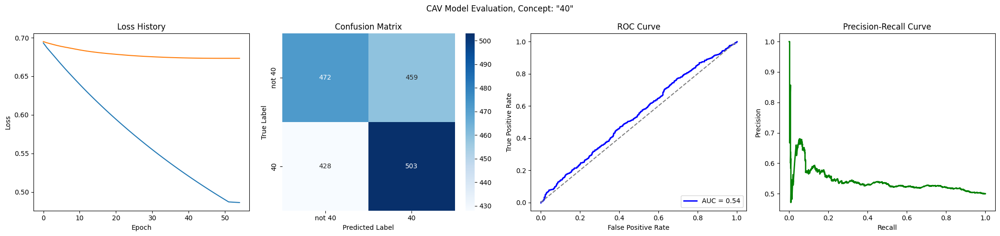

Training run 88/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6925
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_40/loss_history.json


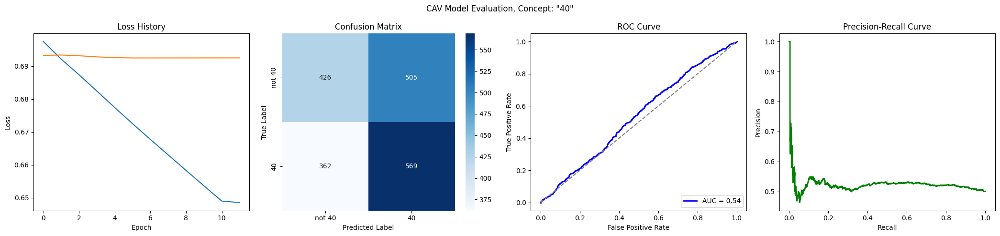

Training run 89/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_40/loss_history.json


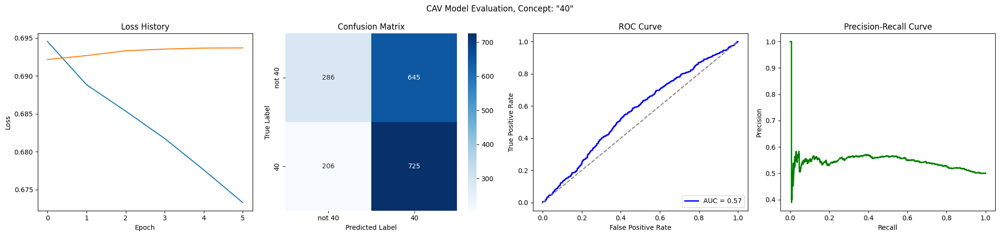

Training run 90/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6401
Epoch 11 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5920
Epoch 21 Validation Loss: 0.6727
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5516
Epoch 31 Validation Loss: 0.6693
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5172
Epoch 41 Validation Loss: 0.6688
Early stopping at epoch 44
Loss history saved to trainings/singer_age_decade_40/loss_history.json


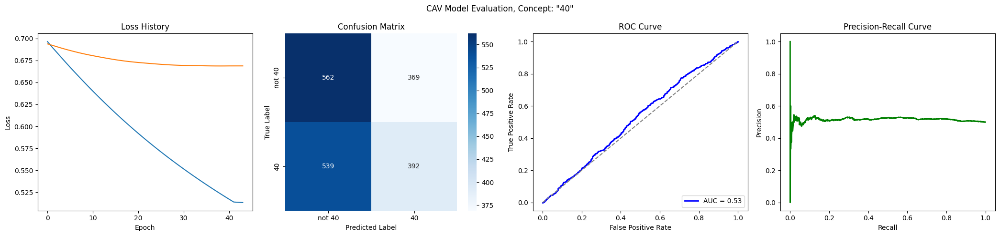

Training run 91/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6877
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6449
Epoch 11 Validation Loss: 0.6785
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6032
Epoch 21 Validation Loss: 0.6748
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_40/loss_history.json


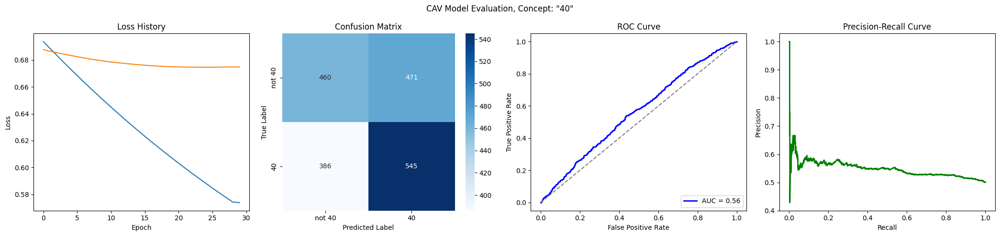

Training run 92/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6990
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6562
Epoch 11 Validation Loss: 0.6811
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6184
Epoch 21 Validation Loss: 0.6725
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5840
Epoch 31 Validation Loss: 0.6683
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5526
Epoch 41 Validation Loss: 0.6661
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5240
Epoch 51 Validation Loss: 0.6646
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4978
Epoch 61 Validation Loss: 0.6642
Early stopping at epoch 65
Loss history saved to trainings/singer_age_decade_40/loss_histor

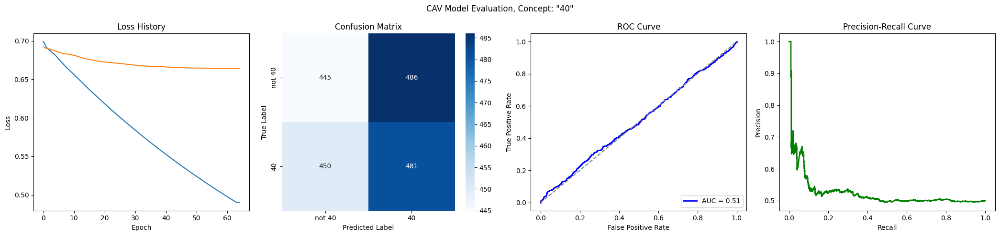

Training run 93/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 9
Loss history saved to trainings/singer_age_decade_40/loss_history.json


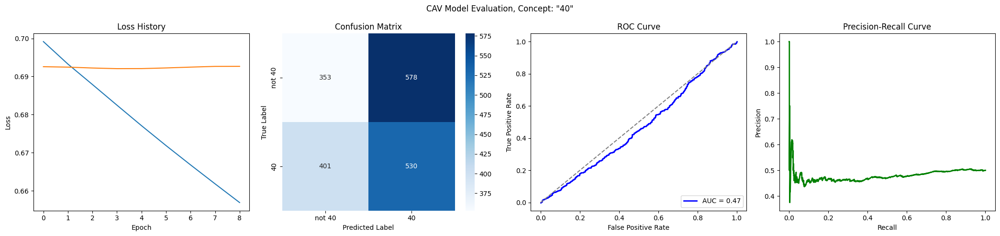

Training run 94/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6880
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6377
Epoch 11 Validation Loss: 0.6865
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5950
Epoch 21 Validation Loss: 0.6838
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5589
Epoch 31 Validation Loss: 0.6825
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5304
Epoch 41 Validation Loss: 0.6823
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_40/loss_history.json


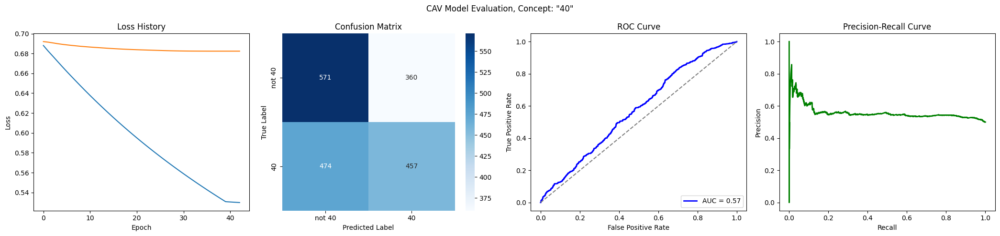

Training run 95/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6411
Epoch 11 Validation Loss: 0.6875
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5966
Epoch 21 Validation Loss: 0.6849
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5599
Epoch 31 Validation Loss: 0.6837
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5282
Epoch 41 Validation Loss: 0.6829
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_40/loss_history.json


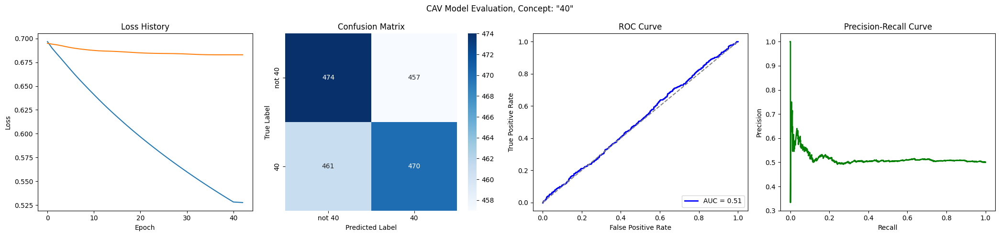

Training run 96/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6531
Epoch 11 Validation Loss: 0.6837
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6168
Epoch 21 Validation Loss: 0.6786
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5846
Epoch 31 Validation Loss: 0.6767
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5581
Epoch 41 Validation Loss: 0.6762
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_40/loss_history.json


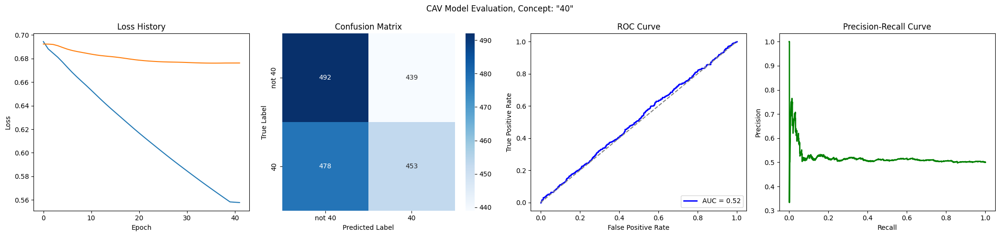

Training run 97/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6439
Epoch 11 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5991
Epoch 21 Validation Loss: 0.6886
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_40/loss_history.json


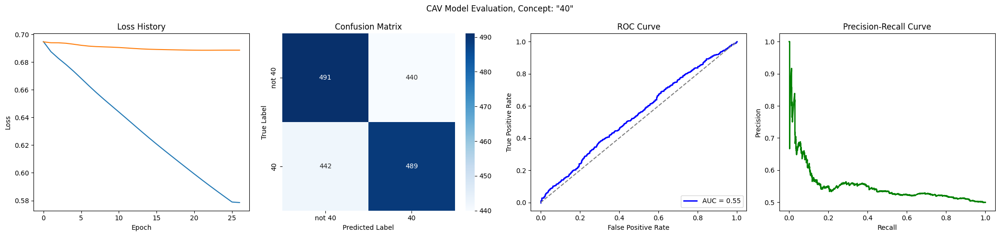

Training run 98/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_40/loss_history.json


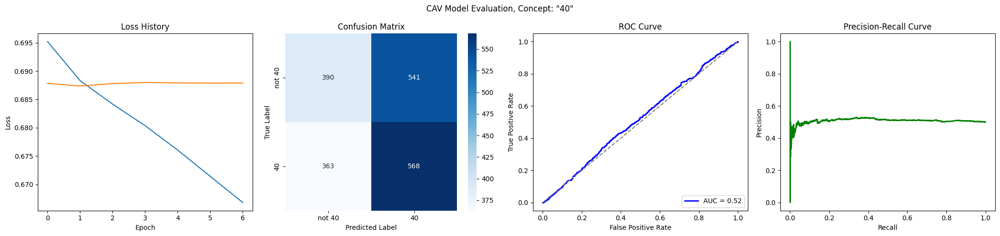

Training run 99/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6852
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6169
Epoch 21 Validation Loss: 0.6803
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5844
Epoch 31 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 36
Loss history saved to trainings/singer_age_decade_40/loss_history.json


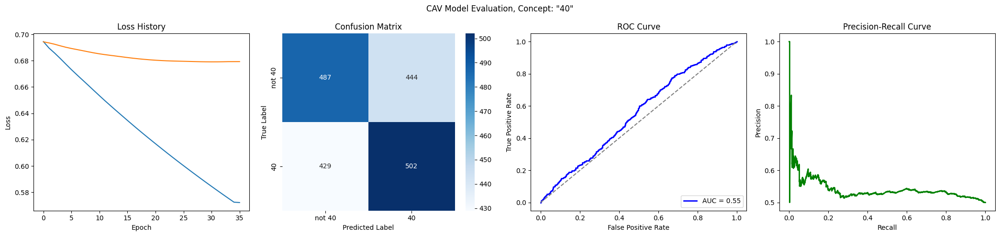

Training run 100/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6467
Epoch 11 Validation Loss: 0.6886
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6050
Epoch 21 Validation Loss: 0.6854
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5688
Epoch 31 Validation Loss: 0.6837
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5372
Epoch 41 Validation Loss: 0.6835
Early stopping at epoch 44
Loss history saved to trainings/singer_age_decade_40/loss_history.json


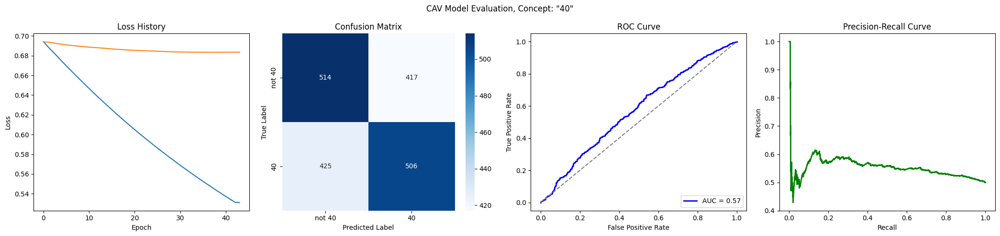

CPU times: user 6min 17s, sys: 2min 44s, total: 9min 2s
Wall time: 31min 49s


In [7]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [8]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [9]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [10]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [11]:
validation_sample_count

192

In [12]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


1728 192
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6848
Model saved to trainings/singer_age_decade_40/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6438
Epoch 11 Validation Loss: 0.6571
Model saved to trainings/singer_age_decade_40/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_40/loss_history.json


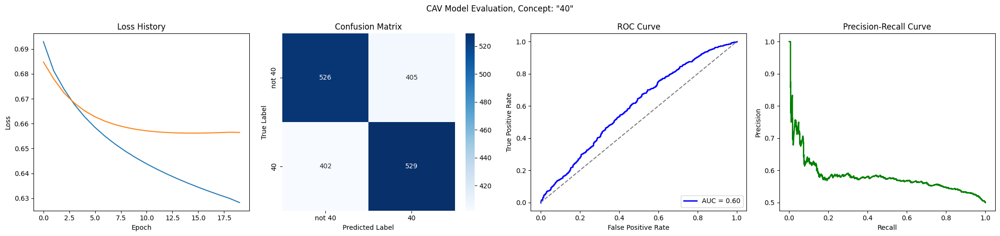

In [13]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
